In [1]:
import numpy as np
from matplotlib import pyplot as plt
import cv2
import moviepy
import glob
import tqdm
import functools
from dataclasses import dataclass
from typing import Tuple, Any, Optional, List, Sequence
import abc
import operator
import glob
import os
from contextlib import contextmanager
from sklearn.linear_model import HuberRegressor
from sklearn.preprocessing import StandardScaler
%config InlineBackend.figure_format = 'retina'

In [2]:
plt.rcParams["figure.figsize"] = (10, 8)

In [3]:
CHESSBOARD_SIZE = (9, 6)
IMAGE_SHAPE = (720, 1280, 3)

## Helper code for image filters

In [4]:
class ImageFilter:
    def __or__(self, other):
        return FunctionalImageFilter(lambda image: self(image) | other(image))
    
    def __and__(self, other):
        return FunctionalImageFilter(lambda image: self(image) & other(image))
    
    def __lshift__(self, image):
        return self(image)
    
    def __rshift__(self, other):
        return FunctionalImageFilter(lambda image: other(self(image)))
    
    def named(self, name):
        return DebugFilter(name, self)

class DebugFilter(ImageFilter):
    def __init__(self, name, image_filter=None):
        super().__init__()
        self.name = name
        self.image_filter = image_filter
    
    def __call__(self, image):
        filtered_image = image if self.image_filter is None else self.image_filter(image)
        if not self.name.startswith('_') and GLOBAL_IMAGE_FILTER_DEBUG_SESSION is not None:
            GLOBAL_IMAGE_FILTER_DEBUG_SESSION.add_image(self.name, filtered_image)
        return filtered_image

class FunctionalImageFilter(ImageFilter):
    def __init__(self, filter_func):
        super().__init__()
        self.filter_func = filter_func
    
    def __call__(self, image):
        return self.filter_func(image)

In [5]:
def image_filter(filter_func):
    @functools.wraps(filter_func)
    def wrapper(*args, **kwargs):
        return FunctionalImageFilter(filter_func(*args, **kwargs))
    return wrapper

In [6]:
class ImageFilterDebugSession:
    def __init__(self, name):
        self.name = name
        self.images = []
    
    def add_image(self, name, image):
        self.images.append((name, image))
    
    def __enter__(self):
        global GLOBAL_IMAGE_FILTER_DEBUG_SESSION
        GLOBAL_IMAGE_FILTER_DEBUG_SESSION = self
        return self
    
    def __exit__(self, *exc):
        global GLOBAL_IMAGE_FILTER_DEBUG_SESSION
        GLOBAL_IMAGE_FILTER_DEBUG_SESSION = None

GLOBAL_IMAGE_FILTER_DEBUG_SESSION = None

In [7]:
@image_filter
def DrawPoints(points, color=(255, 0, 0), thickness=1, is_closed=True):
    return lambda image: cv2.polylines(np.copy(image), [points], is_closed, color, thickness=thickness)
   
@dataclass
class ImShow(ImageFilter):
    axis: Any
    title: Optional[str] = None
    gray: bool = False
    
    def __call__(self, image):
        cmap = 'gray' if self.gray else None
        self.axis.imshow(image, cmap=cmap)
        if self.title is not None:
            self.axis.set_title(self.title)
        return image

@dataclass
class FilterSequence(ImageFilter):
    filters: Sequence[ImageFilter]
    
    def __call__(self, image):
        for image_filter in self.filters:
            image = image_filter(image)
        return image

## Camera calibration

In [9]:
def calibrate_and_make_undistort_filter():
    objp = np.zeros((np.prod(CHESSBOARD_SIZE), 3), np.float32)
    objp[:,:2] = np.mgrid[0:CHESSBOARD_SIZE[0], 0:CHESSBOARD_SIZE[1]].T.reshape(-1, 2)
    objpoints = []
    imgpoints = []
    
    for image_path in tqdm.tqdm(glob.glob('camera_cal/*.jpg')):
        image = plt.imread(image_path)
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        ret, corners = cv2.findChessboardCorners(gray, CHESSBOARD_SIZE, None)
        if ret:
            objpoints.append(objp)
            imgpoints.append(corners)
    assert len(objpoints) > 0
    assert len(imgpoints) > 0
    
    ret, mtx, dist, *_ = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    @image_filter
    def Undistort():
        return lambda img: cv2.undistort(img, mtx, dist, None, mtx)
    return Undistort
Undistort = calibrate_and_make_undistort_filter()

100%|██████████| 20/20 [00:01<00:00, 10.44it/s]


In [10]:
TEST_IMAGE = plt.imread('test_images/straight_lines1.jpg')

## Test undistort

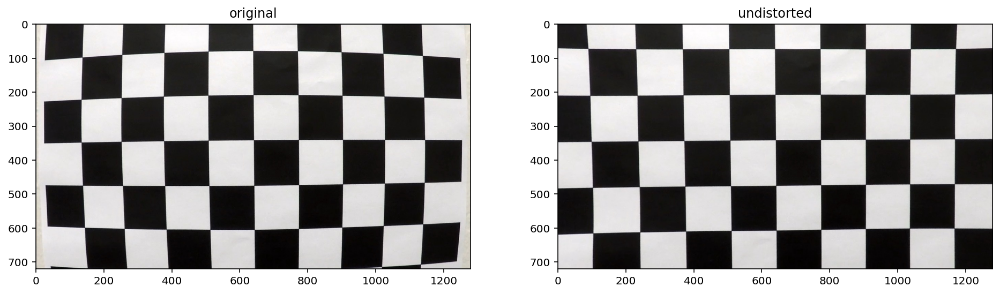

In [11]:
def test_undistort(test_image):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 10))
    return (ImShow(ax1, 'original') >> Undistort() >> ImShow(ax2, 'undistorted')) << test_image
test_undistort(plt.imread('./camera_cal/calibration1.jpg'))
plt.savefig('output_images/test_calibration_chessboard.jpg')

## Perspective transform

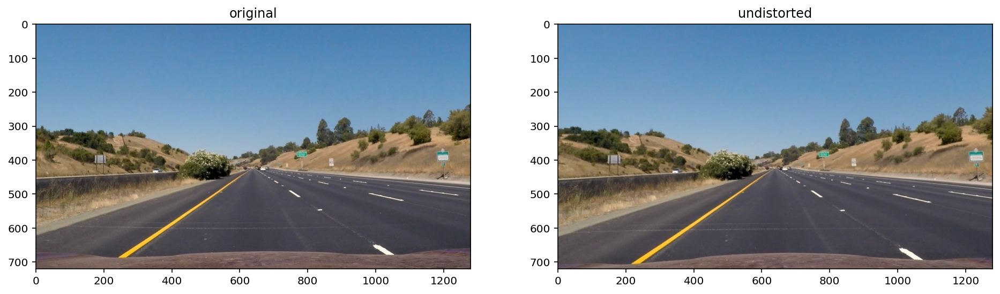

In [12]:
plt.imsave('output_images/lanes_perspective.jpg', test_undistort(plt.imread('test_images/straight_lines1.jpg')))
plt.savefig('output_images/test_calibration_straight_lanes.jpg')

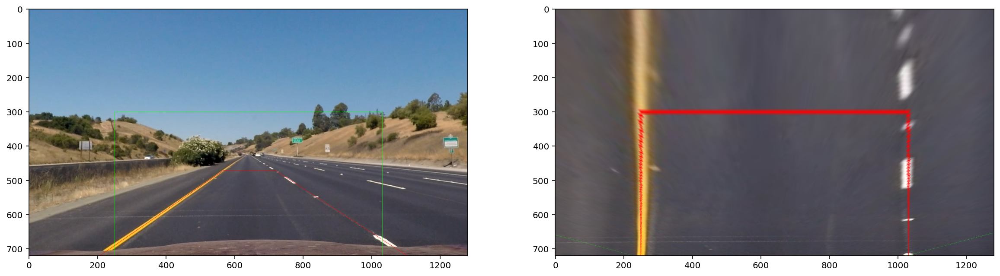

In [38]:
SOURCE_POINTS = np.array([
    [207 - 1, 720],
    [568 - 2, 471],
    [717 + 2, 471],
    [1103, 720],
])

X_MARGIN = 250
Y_MIN = 300
Y_MAX = 735
DESTINATION_POINTS = np.array([
    [X_MARGIN, Y_MAX],
    [X_MARGIN, Y_MIN],
    [1280 - X_MARGIN, Y_MIN],
    [1280 - X_MARGIN, Y_MAX],
])

@image_filter
def WarpPerspective(perspective_matrix):
    return lambda image: cv2.warpPerspective(image, perspective_matrix, IMAGE_SHAPE[1::-1])

PER_M = cv2.getPerspectiveTransform(SOURCE_POINTS.astype(np.float32), DESTINATION_POINTS.astype(np.float32))

_, axes = plt.subplots(1, 2, figsize=(20, 12))
output_warped_image = FilterSequence([
    Undistort(),
    DrawPoints(SOURCE_POINTS),
    DrawPoints(DESTINATION_POINTS, color=(0, 255, 0)),
    ImShow(axes[0]),
    WarpPerspective(PER_M),
    ImShow(axes[1]),
]) << plt.imread('test_images/straight_lines1.jpg');
plt.savefig('output_images/perspective.jpg')
plt.imsave('output_images/output_warped_image.jpg', output_warped_image)

In [14]:
def debug_pipeline(pipeline_filter, image_entries, pipeline_horizontal=True, fig_width=20):
    sessions = []

    for name, image in image_entries:
        with ImageFilterDebugSession(name) as session:
            pipeline_filter << image
            sessions.append(session)
            
    rows = len(sessions[0].images)
    columns = len(sessions)
    if pipeline_horizontal:
        rows, columns = columns, rows
    
    fig_height = (6 / 8) * (fig_width / columns) * rows

    _, axes = plt.subplots(rows, columns, figsize=(fig_width, fig_height))
    for session_index, session in enumerate(sessions):
        for image_index, (image_name, image) in enumerate(session.images):
            row_index = image_index
            columns_index = session_index
            if pipeline_horizontal:
                row_index, columns_index = columns_index, row_index
            axis = axes[row_index][columns_index]
            axis.set_title(f'{session.name}\n{image_name}')
            cmap = 'gray' if len(image.shape) == 2 else None
            axis.imshow(image, cmap=cmap)
            axis.axis('off')

In [21]:
@image_filter
def Thresholded(min_value, max_value):
    return lambda image: np.where((min_value <= image) & (image <= max_value), np.uint8(1), np.uint8(0))

@dataclass
class SobelMagnitude(ImageFilter):
    kernel: int = 5
    
    def __call__(self, image):
        assert len(image.shape) == 2
        sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0, None, self.kernel)
        sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1, None, self.kernel)
        sobel = np.sqrt(sobelx * sobelx + sobely * sobely)
        return sobel

@dataclass
class SobelAngle(ImageFilter):
    kernel: int = 5
    
    def __call__(self, image):
        assert len(image.shape) == 2
        sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0, None, self.kernel)
        sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1, None, self.kernel)
        return np.rad2deg(np.arctan2(sobely, sobelx))

@image_filter
def ConvertColor(conversion_type):
    return lambda image: cv2.cvtColor(image, conversion_type)

@image_filter
def SelectColorPlane(index):
    return lambda image: image[:, :, index]


@image_filter
def BinaryOp(operator, filter1, filter2):
    return lambda image: operator(filter1(image), filter2(image))

@image_filter
def Normalize():
    return lambda image: image / np.median(image[:image.shape[0] // 2, :])

## Identify lanes

In [42]:
def huber_polyfit(x, y, alpha, x0=None):
    def x_transform(x):
        if x0 is None:
            return np.concatenate((x.reshape(-1, 1), x.reshape(-1, 1) * x.reshape(-1, 1)), axis=1)
        else:
            return (x * (x - 2 * x0)).reshape(-1, 1)
    x_tr = x_transform(x)

    x_scaler, y_scaler = StandardScaler(), StandardScaler()
    x_train = x_scaler.fit_transform(x_tr)
    y_train = y_scaler.fit_transform(y[..., None])

    model = HuberRegressor(epsilon=1, alpha=alpha)
    try:
        model.fit(x_train, y_train.ravel())
    except ValueError:
        return np.polyfit(x, y, 2)

    x_min = np.min(x)
    x_max = np.max(x)
    test_x = np.array([x_min, np.mean((x_min, x_max)), x_max])
    pred_y = y_scaler.inverse_transform(model.predict(x_scaler.transform(x_transform(test_x))))
    return np.polyfit(test_x, pred_y, 2)

def fit_parabola(image, x_offset, margin=100, iterations=None, coeffs=None):
    ys_nonzero, xs_nonzero = (image > 0).nonzero()
    height = image.shape[0]
    y_base = height * 0.5
    if coeffs is None:
        bottom_mask = ys_nonzero > y_base
        ys, xs = ys_nonzero[bottom_mask], xs_nonzero[bottom_mask]
        coeffs = huber_polyfit(ys, xs + x_offset, alpha=1e3)
    for iteration in range(iterations):
        points_within_margin_mask = np.abs(np.polyval(coeffs, ys_nonzero) - (xs_nonzero + x_offset)) < margin
        bottom_mask = ys_nonzero > (y_base * (1 - (iteration + 1) / iterations))
        mask = points_within_margin_mask & bottom_mask
        ys, xs = ys_nonzero[mask], xs_nonzero[mask]
        coeffs = huber_polyfit(ys, xs + x_offset, alpha=1e-4, x0=(None if iteration == iterations - 1 else height))
    return coeffs

def get_lanes_coefficients(image, iterations, left_coeffs=None, right_coeffs=None):
    mid_x = image.shape[1] // 2
    x_margin = int(image.shape[1] * 0.1)
    left_coeffs = fit_parabola(image[:, :mid_x + x_margin], x_offset=0, iterations=iterations, coeffs=left_coeffs)
    right_coeffs = fit_parabola(image[:, mid_x - x_margin:], x_offset=mid_x - x_margin, iterations=iterations, coeffs=right_coeffs)
    return left_coeffs, right_coeffs

@dataclass
class DrawParabola(ImageFilter):
    coeffs: Any
    thickness: int
    color: Sequence[int] = (255, 0, 0)
    
    def __call__(self, image):
        height = image.shape[0]
        draw_ys = np.linspace(1, height - 2, 20)
        draw_xs = np.polyval(self.coeffs, draw_ys)
        points_to_draw = np.array([draw_xs, draw_ys]).T.astype(np.int32)
        return DrawPoints(points_to_draw, color=self.color, is_closed=False, thickness=self.thickness)(image)

@dataclass
class DrawLaneCurves(ImageFilter):
    iterations: int = 1
    thickness: int = 5
    
    def __call__(self, image):
        left_coeffs, right_coeffs = get_lanes_coefficients(image, iterations=self.iterations)
        color_image = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
        return (DrawParabola(left_coeffs, thickness=self.thickness) >> DrawParabola(right_coeffs, thickness=self.thickness)) << color_image

@image_filter
def DrawText(text, position):
    return lambda image: cv2.putText(image, text, position, cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 3, cv2.LINE_AA)

## Lanes pipeline

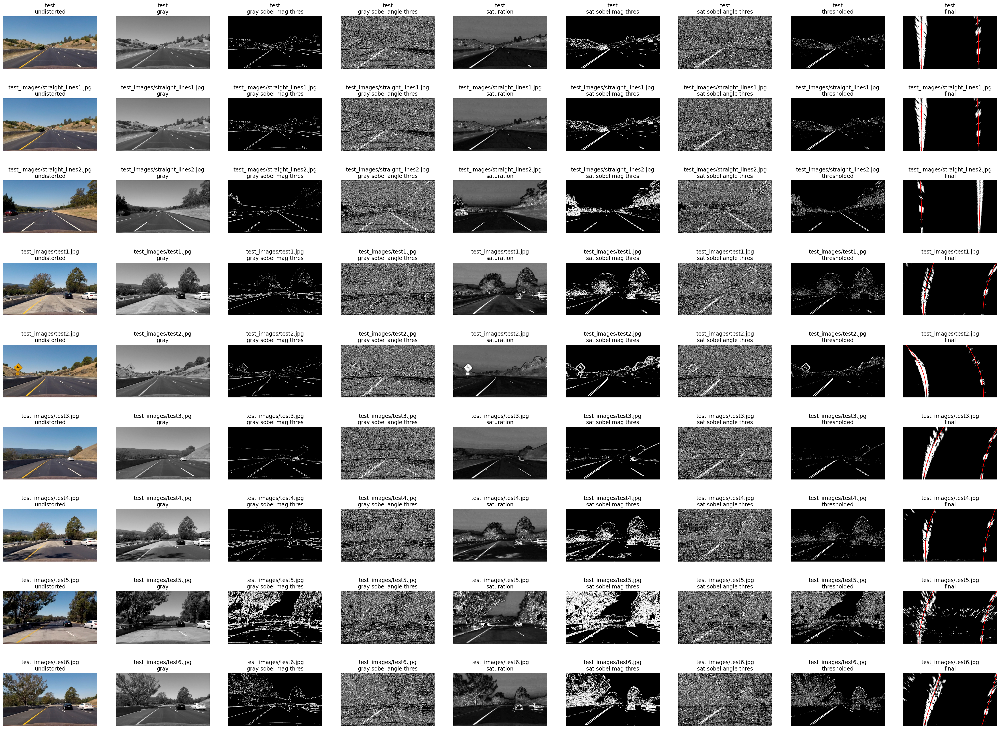

In [28]:
def LanesPipeline():
    gray = ConvertColor(cv2.COLOR_RGB2GRAY).named('gray')
    saturation = (ConvertColor(cv2.COLOR_RGB2HLS) >> SelectColorPlane(2)).named('saturation')
    angle_margin = 20
    angle_threshold = \
        Thresholded(45 - angle_margin, 45 + angle_margin) | \
        Thresholded(135 - angle_margin, 135 + angle_margin) | \
        Thresholded(-45 - angle_margin, -45 + angle_margin) | \
        Thresholded(-135 - angle_margin, -135 + angle_margin)
    
    def ThresholdedSobel(min_value, name):
        return Normalize() >> operator.and_(
            SobelMagnitude().named(f'_{name} sobel mag') >> Thresholded(min_value, np.inf).named(f'{name} sobel mag thres'),
            SobelAngle() >> angle_threshold.named(f'{name} sobel angle thres')
        )
    
    return FilterSequence([
        DebugFilter("undistorted"),
        (gray >> ThresholdedSobel(min_value=15, name='gray')) | (saturation >> ThresholdedSobel(min_value=10, name='sat')),
        DebugFilter("thresholded"),
        FunctionalImageFilter(lambda img: img * 255),
        WarpPerspective(PER_M).named('_warped'),
    ])

debug_pipeline(
    FilterSequence([
        Undistort(),
        LanesPipeline(),
        DrawLaneCurves(iterations=4).named('final'),
    ]),
    image_entries=[
        ('test', TEST_IMAGE),
        *[(filename, plt.imread(filename)) for filename in sorted(glob.glob('test_images/*'))],
    ],
    pipeline_horizontal=True,
    fig_width=40
)
plt.savefig('output_images/pipeline.jpg');

## Process videos

In [32]:
def udacity_helper(undistorted, warped, left_fitx, right_fitx, ploty, Minv):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (undistorted.shape[1], undistorted.shape[0])) 
    # Combine the result with the original image
    return cv2.addWeighted(undistorted, 1, newwarp, 0.3, 0)

In [33]:
class Smoother:
    def __init__(self, window_size):
        self.window_size = window_size
        self.points = []
    
    def accept(self, point):
        point = np.array(point)
        self.points.append(point)
        while len(self.points) > self.window_size:
            self.points.pop(0)
        if len(self.points) == 1:
            return point
        
        points = np.array(self.points)
    
        mask = np.array([True] * len(points))
        for feature_index in range(points.shape[1]):
            xs = np.arange(len(points))
            ys = points[:, feature_index]
            coeffs = np.polyfit(xs, ys, 1)
            ys_pred = np.polyval(coeffs, xs)
            errors = ys_pred - ys
            sigma = np.std(errors)
            mask = mask & (np.abs(errors) < (1.5 * sigma))
        
        if np.sum(mask) < 2:
            return point
        
        result_point = np.copy(point)
        for feature_index in range(points.shape[1]):
            xs = np.arange(len(points))
            ys = points[:, feature_index]
            xs = xs[mask]
            ys = ys[mask]
            coeffs = np.polyfit(xs, ys, 1)
            [y] = np.polyval(coeffs, [len(points) - 1])
            result_point[feature_index] = y
            
        return result_point

In [58]:
YM_PER_PIX = 3 / 87
XM_PER_PIX = 3.7 / 780

def curvature_radius(coeffs, y0):
    a_0, b_0, _ = coeffs
    a = XM_PER_PIX / (YM_PER_PIX ** 2) * a_0
    b = (XM_PER_PIX / YM_PER_PIX) * b_0
    y = y0 * YM_PER_PIX
    return np.power(1 + np.power(2 * a * y + b, 2), 3 / 2) / (2 * a)

In [84]:
class VideoProcessor:
    def __init__(self, window_size=10, include_warped=False, smoothed_color=(0, 255, 0), color=(255, 0, 0)):
        self.window_size = window_size
        self.include_warped = include_warped
        self.left_lane_smoother = Smoother(window_size=window_size)
        self.right_lane_smoother = Smoother(window_size=window_size)
        self.smoothed_color = smoothed_color
        self.left_lane_radius_smoother = Smoother(window_size=window_size)
        self.right_lane_radius_smoother = Smoother(window_size=window_size)
        self.color = color
        self.last_left_coeffs = None
        self.last_right_coeffs = None
    
    def process_image(self, image):
        undistorted = Undistort() << image
        warped = LanesPipeline() << undistorted
        height, width = warped.shape
        left_coeffs, right_coeffs = get_lanes_coefficients(warped, iterations=4,
                                                           left_coeffs=self.last_left_coeffs,
                                                           right_coeffs=self.last_right_coeffs)
        
        mean_left_coeffs = self.left_lane_smoother.accept(left_coeffs)
        mean_right_coeffs = self.right_lane_smoother.accept(right_coeffs)
        
        self.last_left_coeffs = mean_left_coeffs
        self.last_right_coeffs = mean_right_coeffs
        
        ploty = np.linspace(0, height, 20)
        left_fitx, right_fitx = [np.polyval(coeffs, ploty) for coeffs in (mean_left_coeffs, mean_right_coeffs)]
        result = udacity_helper(undistorted, warped, left_fitx, right_fitx, ploty, np.linalg.inv(PER_M))
        
        if self.include_warped:
            thickness = 5
            color_warped = FilterSequence([
                ConvertColor(cv2.COLOR_GRAY2RGB),
                DrawParabola(left_coeffs, thickness, color=self.color),
                DrawParabola(right_coeffs, thickness, color=self.color),
                DrawParabola(mean_left_coeffs, thickness, color=self.smoothed_color),
                DrawParabola(mean_right_coeffs, thickness, color=self.smoothed_color),
            ]) << warped
            result = np.concatenate((result, color_warped), axis=0)
        
        def DrawCurvatureRadius(radius, position):
            return DrawText(f'Curve radius: {radius:5.0f}(m)', position)
        
        left_radius = curvature_radius(left_coeffs, image.shape[0])
        mean_left_radius, = self.left_lane_radius_smoother.accept([left_radius])
        right_radius = curvature_radius(right_coeffs, image.shape[0])
        mean_right_radius, = self.right_lane_radius_smoother.accept([right_radius])
        
        left_lane_base_x = np.polyval(mean_left_coeffs, [height])
        right_lane_base_x = np.polyval(mean_right_coeffs, [height])
        car_distance = YM_PER_PIX * np.abs(np.mean([left_lane_base_x, right_lane_base_x]) - (width / 2))
        
        displayed_radius = min((mean_left_radius, mean_right_radius), key=abs)
        
        return FilterSequence([
#             DrawCurvatureRadius(mean_left_radius, (10, 40)),
#             DrawCurvatureRadius(mean_right_radius, (10, 80)),
            DrawCurvatureRadius(displayed_radius, (10, 120)),
            DrawText(f'Dist: {car_distance:.2f}(m)', (10, 160)),
        ]) << result

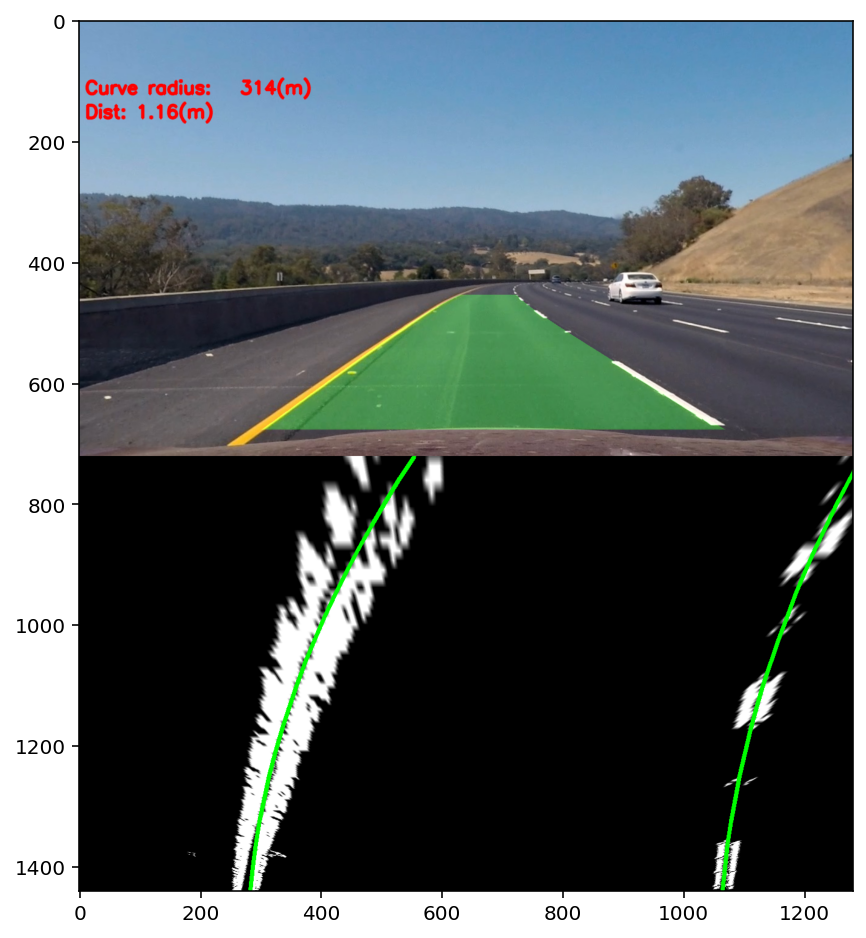

In [88]:
plt.imshow(VideoProcessor(include_warped=True).process_image(plt.imread('test_images/test3.jpg')))
plt.savefig('output_images/final frame.jpg')

In [86]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [87]:
white_output = 'test_videos_output/project_video.mp4'
clip1 = VideoFileClip("project_video.mp4")#.subclip(22, 25)
video_processor = VideoProcessor(window_size=15, include_warped=True)
white_clip = clip1.fl_image(video_processor.process_image)

%time white_clip.write_videofile(white_output, audio=False)

t:   0%|          | 0/1260 [00:00<?, ?it/s, now=None]

Moviepy - Building video test_videos_output/project_video.mp4.
Moviepy - Writing video test_videos_output/project_video.mp4




t:  10%|▉         | 124/1260 [01:05<09:12,  2.05it/s, now=None]


t:  20%|█▉        | 246/1260 [02:12<10:00,  1.69it/s, now=None]


t:  29%|██▉       | 368/1260 [03:23<09:11,  1.62it/s, now=None]


t:  39%|███▉      | 490/1260 [04:38<07:30,  1.71it/s, now=None]


t:  49%|████▊     | 612/1260 [05:45<06:30,  1.66it/s, now=None]


t:  58%|█████▊    | 734/1260 [06:56<04:56,  1.77it/s, now=None]


t:  68%|██████▊   | 856/1260 [08:04<03:38,  1.85it/s, now=None]


t:  78%|███████▊  | 978/1260 [09:10<02:19,  2.03it/s, now=None]


t:  87%|████████▋ | 1098/1260 [10:10<01:25,  1.89it/s, now=None]


t:  97%|█████████▋| 1218/1260 [11:12<00:21,  1.99it/s, now=None]


t:  49%|████▉     | 622/1260 [16:02<04:49,  2.21it/s, now=None] 

Moviepy - Done !
Moviepy - video ready test_videos_output/project_video.mp4
CPU times: user 1h 22min 29s, sys: 2min 38s, total: 1h 25min 7s
Wall time: 11min 34s
